# Object Detection

Create a YOLO detcetion model. You have to:
- Collect your dataset
- Anotatet the dataset.
- Train the model.
- Plot samples of the detected objects.

Yolov8: https://www.bing.com/videos/riverview/relatedvideo?q=yolov8+dataset&mid=0CA64671D4B0B98809660CA64671D4B0B9880966&FORM=VIRE

In [1]:
!nvidia-smi

Wed Jul 17 22:54:38 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   45C    P8              16W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install ultralytics

In [3]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display

display.clear_output()
!yolo version

8.2.59


In [4]:
display.clear_output()
!yolo checks

Ultralytics YOLOv8.2.59 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Setup complete ✅ (12 CPUs, 53.0 GB RAM, 30.1/78.2 GB disk)

OS                  Linux-6.1.85+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 52.96 GB
CPU                 Intel Xeon 2.20GHz
CUDA                12.1

numpy               ✅ 1.25.2<2.0.0,>=1.23.0
matplotlib          ✅ 3.7.1>=3.3.0
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.3.1+cu121>=1.8.0
torchvision         ✅ 0.18.1+cu121>=0.9.0
tqdm                ✅ 4.66.4>=4.64.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
pandas              ✅ 2.0.3>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0
ultralytics-thop    ✅ 2.0.0>=2.0.0


In [5]:
!pip install roboflow

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
!unzip '/content/drive/MyDrive/drowsiness project.v3i.yolov8-obb.zip'

Archive:  /content/drive/MyDrive/drowsiness project.v3i.yolov8-obb.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/295_jpg.rf.0cb399eed0a470cf0a0faf5ddb3c2944.jpg  
 extracting: test/images/296_jpg.rf.c64e501443c8f37600ab6f7b64e7455b.jpg  
 extracting: test/images/297_jpg.rf.e5a03498f9f708e51f463492af4594ef.jpg  
 extracting: test/images/298_jpg.rf.ecf074c5dbd491d38c8e2aef1aa15f1f.jpg  
 extracting: test/images/299_jpg.rf.a8453e860610f8c85db8e301903c3421.jpg  
 extracting: test/images/300_jpg.rf.f20b8e61e2764937700d73d1f7d91de8.jpg  
 extracting: test/images/301_jpg.rf.cf60bbd9aaefdace044727bbfaada02f.jpg  
 extracting: test/images/302_jpg.rf.0f874f3960b22d085e14cfdd119d9d66.jpg  
 extracting: test/images/303_jpg.rf.37f57ec695aafd7a73515cf4cc2b9e77.jpg  
 extracting: test/images/304_jpg.rf.faaf1fbe7453e1e14e88abff2a954517.jpg  
 extracting: test/im

In [17]:
!yolo task=detect mode=train model=yolov8n.pt data=/content/datasets/roboflow/data.yaml epochs=20 imgsz=640

Ultralytics YOLOv8.2.59 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/roboflow/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

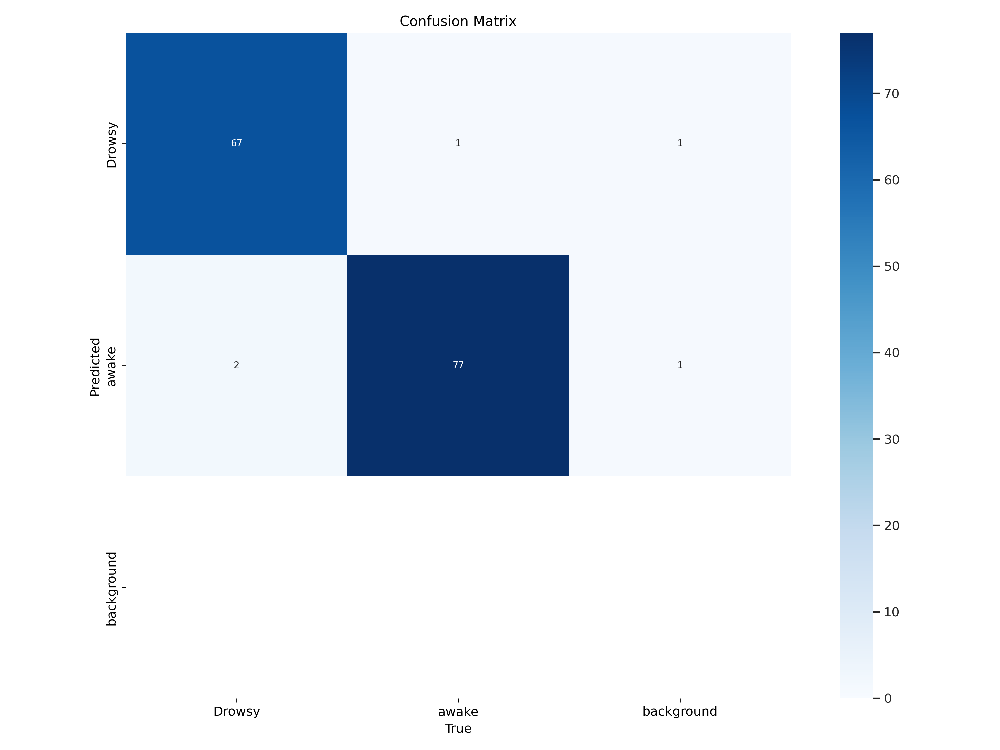

In [19]:
Image(filename=r'/content/runs/detect/train10/confusion_matrix.png', width = 600)

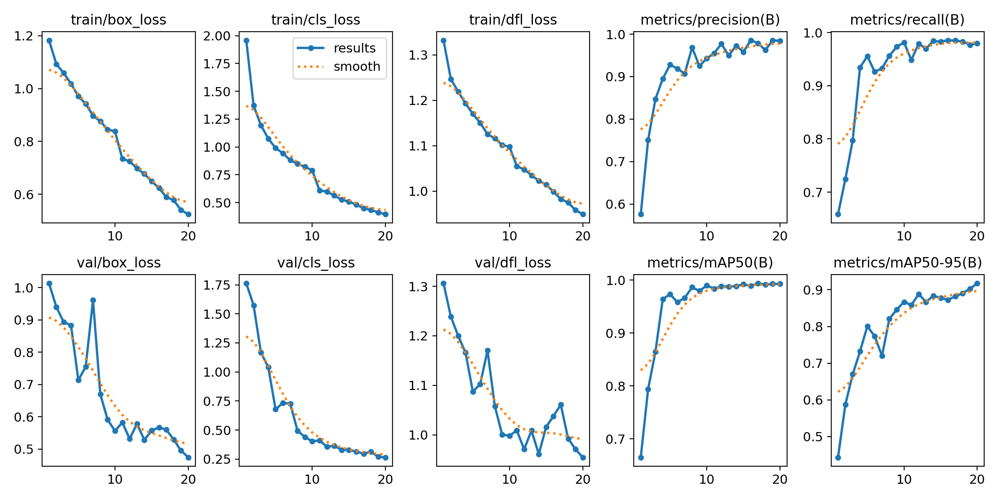

In [20]:
Image(filename=r'/content/runs/detect/train10/results.png', width = 600)

In [24]:
!yolo task=detect mode=predict model=/content/runs/detect/train10/weights/best.pt conf=0.5 source=/content/datasets/roboflow/test/images

Ultralytics YOLOv8.2.59 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs

image 1/107 /content/datasets/roboflow/test/images/295_jpg.rf.0cb399eed0a470cf0a0faf5ddb3c2944.jpg: 640x640 1 awake, 7.4ms
image 2/107 /content/datasets/roboflow/test/images/296_jpg.rf.c64e501443c8f37600ab6f7b64e7455b.jpg: 640x640 1 Drowsy, 8.0ms
image 3/107 /content/datasets/roboflow/test/images/297_jpg.rf.e5a03498f9f708e51f463492af4594ef.jpg: 640x640 1 Drowsy, 7.3ms
image 4/107 /content/datasets/roboflow/test/images/298_jpg.rf.ecf074c5dbd491d38c8e2aef1aa15f1f.jpg: 640x640 1 awake, 7.3ms
image 5/107 /content/datasets/roboflow/test/images/299_jpg.rf.a8453e860610f8c85db8e301903c3421.jpg: 640x640 1 Drowsy, 7.5ms
image 6/107 /content/datasets/roboflow/test/images/300_jpg.rf.f20b8e61e2764937700d73d1f7d91de8.jpg: 640x640 1 awake, 7.2ms
image 7/107 /content/datasets/roboflow/test/images/301_jpg.rf.cf60bbd9aaefdace044727bbfaa

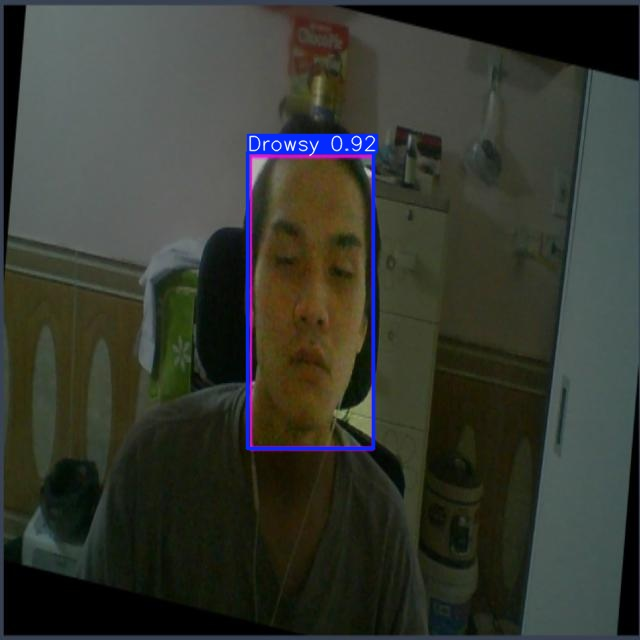

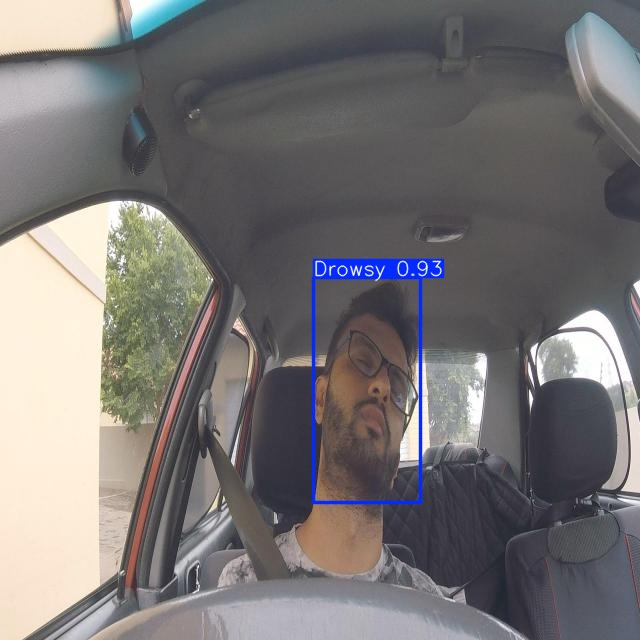

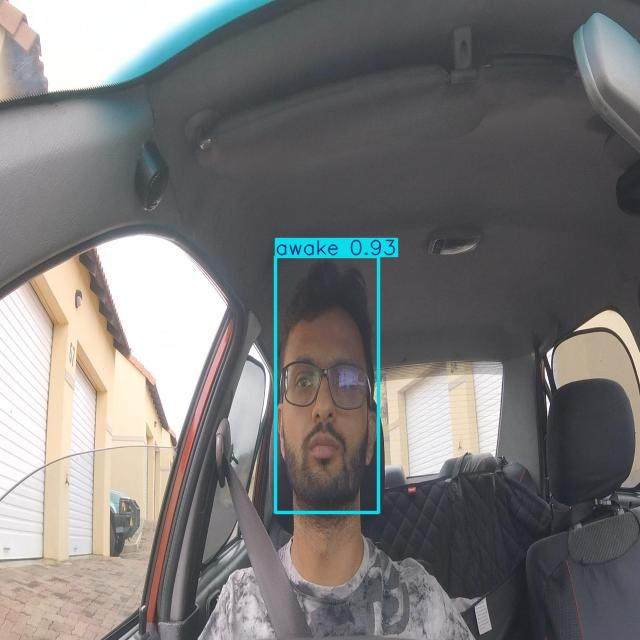

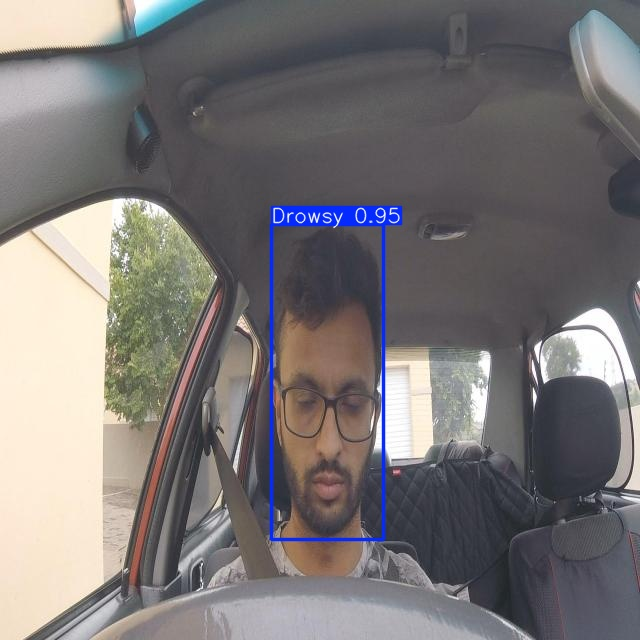

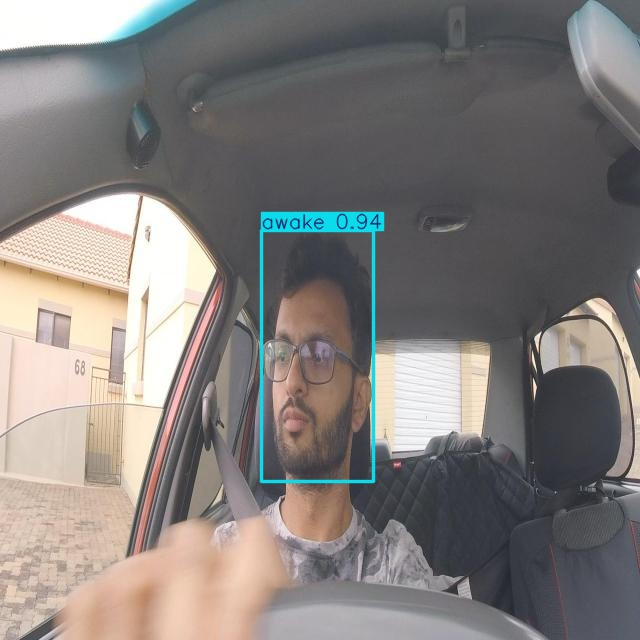

...

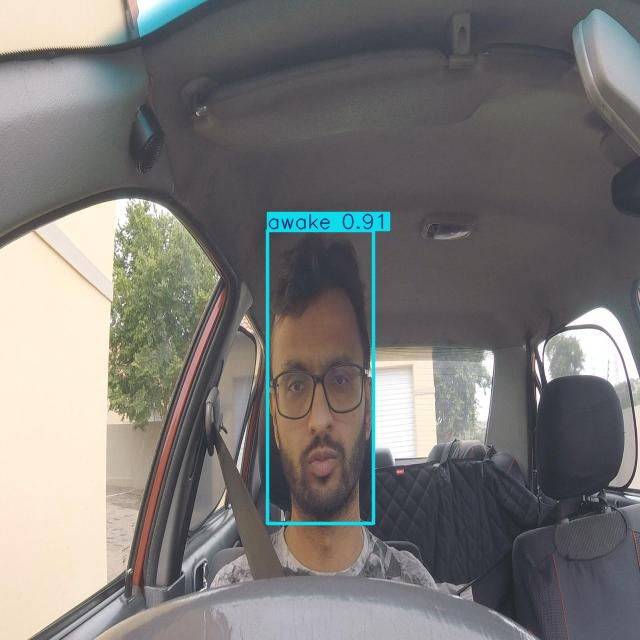

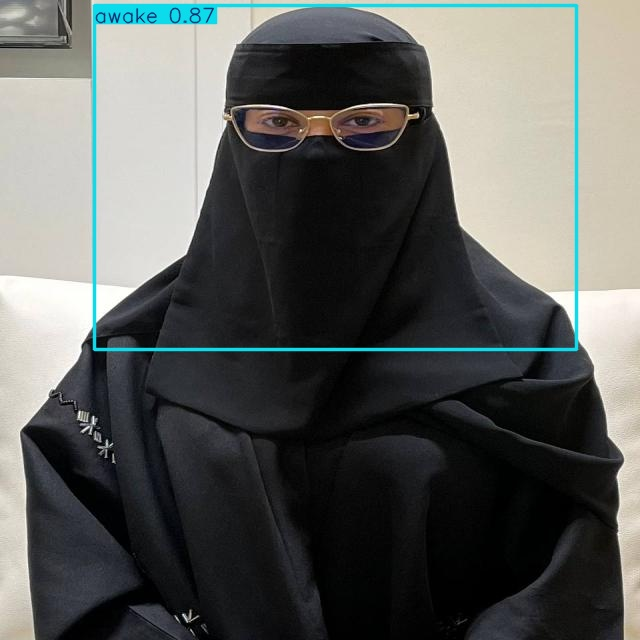

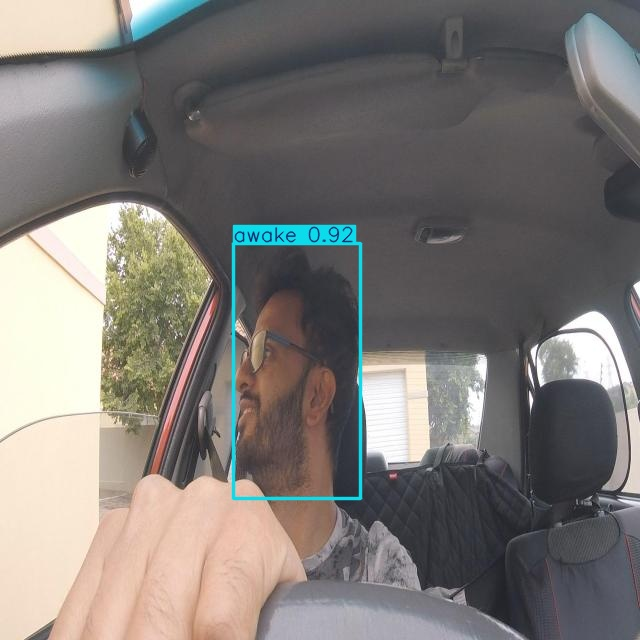

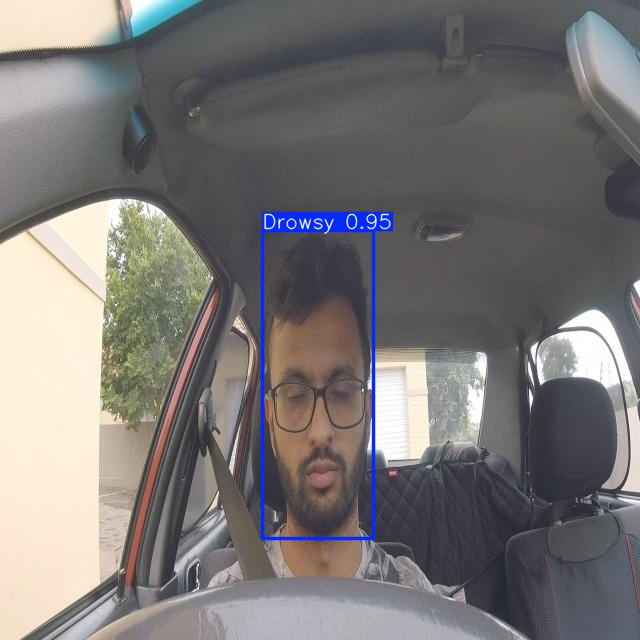

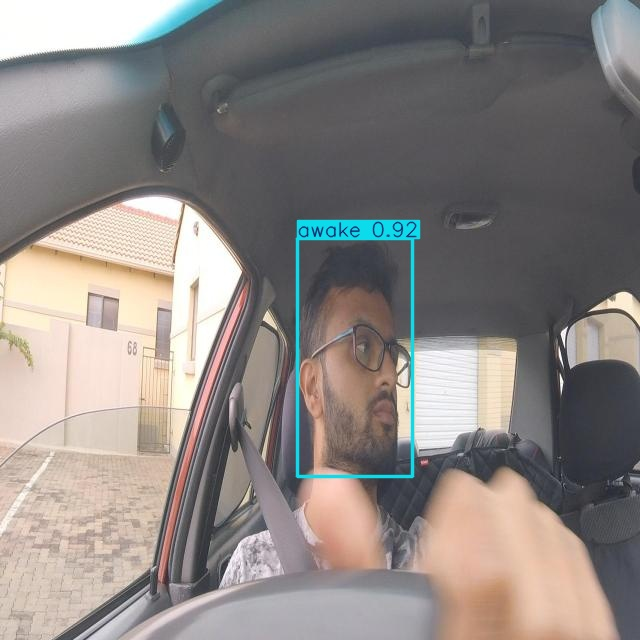

In [25]:
import glob
from IPython.display import Image, display
for imageName in glob.glob('/content/runs/detect/predict/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

In [32]:
!yolo task=detect mode=val model=/content/runs/detect/train10/weights/best.pt  data=/content/datasets/roboflow/data.yaml


Ultralytics YOLOv8.2.59 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/datasets/roboflow/valid/labels.cache... 145 images, 0 backgrounds, 0 corrupt: 100% 145/145 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 10/10 [00:03<00:00,  3.04it/s]
                   all        145        147      0.984       0.98      0.993      0.919
                Drowsy         67         69      0.985      0.973      0.991      0.917
                 awake         78         78      0.983      0.987      0.994      0.921
Speed: 1.5ms preprocess, 3.6ms inference, 0.0ms loss, 7.1ms postprocess per image
Results saved to runs/detect/val2
💡 Learn more at https://docs.ultralytics.com/modes/val


In [35]:
import glob
from IPython.display import Image, display
for imageName in glob.glob('/content/runs/detect/val/images/*.jpg'):
    display(Image(filename=imageName))
    print("\n")